# Case Kognita

- **1. Determinar os pontos de interesse geográficos (POIs) localizados dentro de cada município, e mapear as categorias relacionadas a potenciais concorrentes.**
- **2. Plotar, usando uma escala de cores adequada, um mapa da quantidade total de POIs por município.**
- **3. Para cada uma das top 5 categorias de POIs (em termos de quantidade), fazer o mesmo que o item 2.**
- **4. Para as categorias de POIs que foram identificadas como possíveis concorrentes, fazer o mesmo que o item 2. Considere as categorias agrupadas para gerar apenas 1 mapa.**
- **5. Para os dados utilizados para gerar os 7 mapas acima, determinar a correlação espacial (coeficiente I de Moran global) da quantidade de POIs no nível de município.**
- **6. Plotar os dados de faturamento (considere a mediana do faturamento no período disponibilizado) exibindo informações de lat long e o faturamento no "hover" do mouse sobre o ponto.**
- **7. Dada a tabela de faturamentos fictícios, determinar a correlação espacial (coeficiente I de Moran global) do faturamento total no nível de município.**

- *Baseado no faturamento histórico, determinar programaticamente quais unidades estão com tendência de alta ou de baixa no faturamento. Adicionar essa informação de alta ou baixa no gráfico do item 6.*

- *Plotar o faturamento médio por município usando alguma escala de cores que julgue razoável.*

- *Idem para o faturamento médio por 100 mil habitantes.*

# 0.1 Imports

In [1]:
pip install geobr

  Using cached Shapely-1.8.5.post1-cp310-cp310-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (2.0 MB)
  Attempting uninstall: shapely
    Found existing installation: shapely 2.0.4
    Uninstalling shapely-2.0.4:
      Successfully uninstalled shapely-2.0.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
libpysal 4.10 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
momepy 0.7.0 requires shapely>=2, but you have shapely 1.8.5.post1 which is incompatible.
spopt 0.6.0 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.


In [2]:
pip install pysal

  Using cached shapely-2.0.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.5 MB)
  Attempting uninstall: shapely
    Found existing installation: Shapely 1.8.5.post1
    Uninstalling Shapely-1.8.5.post1:
      Successfully uninstalled Shapely-1.8.5.post1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
geobr 0.2.1 requires shapely<2.0.0,>=1.7.0, but you have shapely 2.0.4 which is incompatible.


In [3]:
pip install pygeos

In [4]:
pip install mapclassify

In [5]:
import pandas as pd
import numpy as np
import geopandas as gpd
import datetime
import folium
import geobr
import matplotlib.pyplot as plt
import rtree
import pygeos
import mapclassify
from geopy.geocoders import Nominatim
from shapely.geometry import Point
from esda.moran import Moran
from libpysal.weights import Queen

In [62]:
df_POT = pd.read_parquet("/pontos_interesse_geograficos.parquet", engine='pyarrow')
df_uni_fat = pd.read_parquet("/unidades_faturamento.parquet", engine='pyarrow')

In [63]:
# Resetar o índice para criar um novo índice numérico padrão
df_POT.reset_index(drop=True, inplace=True)

# Adicionar uma coluna 'id' ao DataFrame com um identificador único para cada linha
df_POT['id'] = df_POT.index.astype(int)

df_POT.head()

,latitude,longitude,tipo_negocio,id
0,-21.189135,-47.807438,beleza,0
1,-23.187898,-46.886983,comercio,1
2,-22.741225,-47.409536,igreja,2
3,-20.621171,-49.655204,oficina,3
4,-23.504184,-46.809928,igreja,4


In [64]:
df_uni_fat.head()

,id_unidade,2021-03-01 00:00:00,2021-04-01 00:00:00,2021-05-01 00:00:00,2021-06-01 00:00:00,2021-07-01 00:00:00,2021-08-01 00:00:00,2021-09-01 00:00:00,2021-10-01 00:00:00,2021-11-01 00:00:00,2021-12-01 00:00:00,latitude,longitude
0,0,5.068153e+06,5.032582e+06,5.398609e+06,4.471029e+06,6.055479e+06,5.681750e+06,5.450168e+06,5.690872e+06,5.920992e+06,6.936104e+06,-22.958200,-47.019540
1,1,9.175876e+04,1.005467e+05,9.437164e+04,1.055623e+05,1.044879e+05,9.704052e+04,9.734873e+04,1.249605e+05,1.030219e+05,9.041489e+04,-22.786824,-45.207747
2,2,9.014478e+06,8.241358e+06,9.894769e+06,9.829395e+06,1.024933e+07,9.738263e+06,8.993409e+06,9.298967e+06,9.827378e+06,1.105133e+07,-22.812076,-47.176020
3,3,7.092469e+06,5.935713e+06,6.619112e+06,6.074868e+06,6.548820e+06,6.266509e+06,6.564165e+06,6.333653e+06,6.029334e+06,7.246248e+06,-23.940756,-46.369782
4,4,9.656845e+04,9.653138e+04,9.078938e+04,9.514808e+04,8.344678e+04,1.095175e+05,1.028503e+05,1.009396e+05,9.604377e+04,1.222533e+05,-23.030960,-46.974822


# 1.0 Descrição dos dados

## 1.1 Dimensão dos dados

In [65]:
# df_uni_fat
print('Number of Rows: {}'.format(df_uni_fat.shape[0]))
print('Number of Cols: {}'.format(df_uni_fat.shape[1]))

Number of Rows: 500
Number of Cols: 13


In [66]:
# df_POT
print('Number of Rows: {}'.format(df_POT.shape[0]))
print('Number of Cols: {}'.format(df_POT.shape[1]))

Number of Rows: 1016733
Number of Cols: 4


## 1.2 Data Types

In [67]:
# df_uni_fat
df_uni_fat.dtypes

id_unidade               int64
2021-03-01 00:00:00    float64
2021-04-01 00:00:00    float64
2021-05-01 00:00:00    float64
2021-06-01 00:00:00    float64
2021-07-01 00:00:00    float64
2021-08-01 00:00:00    float64
2021-09-01 00:00:00    float64
2021-10-01 00:00:00    float64
2021-11-01 00:00:00    float64
2021-12-01 00:00:00    float64
latitude               float64
longitude              float64
dtype: object

In [68]:
# df_POT
df_POT.dtypes

latitude        float64
longitude       float64
tipo_negocio     object
id                int64
dtype: object

## 1.3 Check NA's

In [69]:
# df_POT
df_POT.isna().sum()

latitude        0
longitude       0
tipo_negocio    0
id              0
dtype: int64

In [70]:
# df_uni_fat
df_uni_fat.isna().sum()

id_unidade             0
2021-03-01 00:00:00    0
2021-04-01 00:00:00    0
2021-05-01 00:00:00    0
2021-06-01 00:00:00    0
2021-07-01 00:00:00    0
2021-08-01 00:00:00    0
2021-09-01 00:00:00    0
2021-10-01 00:00:00    0
2021-11-01 00:00:00    0
2021-12-01 00:00:00    0
latitude               0
longitude              0
dtype: int64

# Data Cleaning
Deixando o dataset apenas com potenciais concorrentes

In [71]:
df_POT['tipo_negocio'].unique()

array(['beleza', 'comercio', 'igreja', 'oficina', 'transporte',
       'restaurante', 'fornecedor', 'dentista', 'padaria', 'negocio',
       'prestador', 'correio', 'evento', 'concessionaria', 'escola',
       'supermercado', 'amenidade', 'escritório', 'outros', 'combustivel',
       'fabricante', 'clinica', 'farmacia', 'saude', 'academia',
       'praia publica', 'medico', 'petshop', 'publico', 'distribuidor',
       'hospedagem', 'esporte', 'estacionamento', 'caixa', 'hospital',
       'veterinario', 'autoescola', 'banco', 'laboratorio', 'cartorio',
       'servicopublico', 'organizacao', 'universidade', 'eventos',
       'clube', 'moradia', 'policia', 'fazenda', 'aeroporto', 'shopping',
       'bombeiro', 'cinema', 'exercito', 'heliporto'], dtype=object)

In [72]:
concorrentes = ['comercio', 'fornecedor','supermercado', 'distribuidor', 'restaurante', 'padaria', 'outros', 'shopping']
df_POT_concorrentes = df_POT[df_POT['tipo_negocio'].isin(concorrentes)]

Encontrando a mediana do faturamento e excluindo as colunas de data

In [73]:
colunas_datas = [faturamento for faturamento in df_uni_fat.columns if faturamento not in ['latitude', 'longitude', 'id_unidade', 'mediana_faturamento']]

df_uni_fat['mediana_faturamento'] = df_uni_fat[colunas_datas].median(axis=1)

df_uni_fat.drop(columns=colunas_datas, inplace=True)

In [74]:
df_uni_fat.head()

,id_unidade,latitude,longitude,mediana_faturamento
0,0,-22.958200,-47.019540,5.565959e+06
1,1,-22.786824,-45.207747,9.894770e+04
2,2,-22.812076,-47.176020,9.782820e+06
3,3,-23.940756,-46.369782,6.441236e+06
4,4,-23.030960,-46.974822,9.654992e+04


# 2.0 Definindo pontos de unidades de faturamento no mapa

In [75]:
muni = geobr.read_municipality(code_muni="SP", year=2020)

<Axes: >

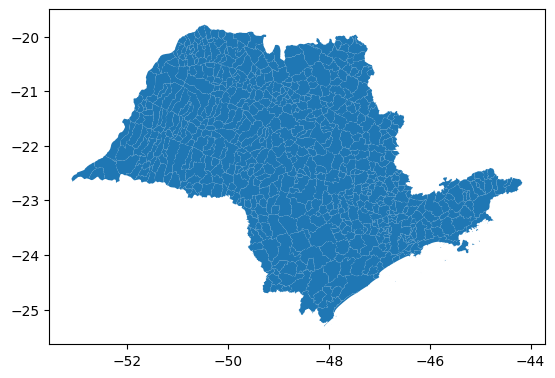

In [76]:
gdf_muni = geobr.read_municipality(code_muni="SP", year=2020)
gdf_muni.plot()

In [77]:
gdf_muni.crs= 'epsg:4674'
gdf_muni.explore()

In [78]:
geometria = [Point(xy) for xy in zip(df_uni_fat['longitude'], df_uni_fat['latitude'])]
crs = {'init': 'epsg:4326'}  # Sistema de coordenadas WGS84 (padrão para latitude/longitude)

# Criar o GeoDataFrame
geo_df_uni = gpd.GeoDataFrame(df_uni_fat, crs=crs, geometry=geometria)
geo_df_uni.crs= 'epsg:4674'

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [79]:
gdf_base_fat = gpd.sjoin(geo_df_uni, gdf_muni)

## 2.1 Plotar os dados de faturamento (considere a mediana do faturamento no período disponibilizado) exibindo informações de lat long e o faturamento no "hover" do mouse sobre o ponto.

In [80]:
gdf_base_fat.explore()

In [81]:
gdf_base_fat.columns

Index(['id_unidade', 'latitude', 'longitude', 'mediana_faturamento',
       'geometry', 'index_right', 'code_muni', 'name_muni', 'code_state',
       'abbrev_state', 'name_state', 'code_region', 'name_region'],
      dtype='object')

In [82]:
m = gdf_base_fat.explore(
    color='blue',
    tooltip='name_muni',
    name='Unidades de Faturamento',
    tiles='CartoDB positron'
)
gdf_base_fat.explore(
    m=m,
    column='name_muni',
    scheme='naturalbreaks',
    cmap='Spectral',
    tooltip=False,
    style_kwds=dict(color='black', weight=1, opacity=0.4),
    popup=['id_unidade', 'name_muni'],
    legend=True,
    legend_kwds=dict(caption= 'Legenda'),
    marker_type='circle_marker',
    marker_kwds=dict(radius=5),
    height=600,
    width=600,
)

# 3.0 Definindo Pontos de Interesse

In [27]:
geometria_POT = [Point(xy) for xy in zip(df_POT['longitude'], df_POT['latitude'])]
crs = {'init': 'epsg:4326'}  # Sistema de coordenadas WGS84 (padrão para latitude/longitude)

# Criar o GeoDataFrame
geo_df_POT = gpd.GeoDataFrame(df_POT, crs=crs, geometry=geometria_POT)
geo_df_POT.crs= 'epsg:4674'

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [28]:
gdf_base_POT = gpd.sjoin(geo_df_POT, gdf_muni)

## 3.1 Definindo um sample pois o dataset é muito grande e o PC não roda

In [29]:
amostra = df_POT.sample(n=2500, replace=False, random_state=42)

In [30]:
geometria_POT_sample = [Point(xy) for xy in zip(amostra['longitude'], amostra['latitude'])]
crs = {'init': 'epsg:4326'}  # Sistema de coordenadas WGS84 (padrão para latitude/longitude)

# Criar o GeoDataFrame
geo_df_POT_sample = gpd.GeoDataFrame(amostra, crs=crs, geometry=geometria_POT_sample)
geo_df_POT_sample.crs= 'epsg:4674'

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [31]:
gdf_base_POT_sample = gpd.sjoin(geo_df_POT_sample, gdf_muni)

In [32]:
gdf_base_POT_sample.explore()

In [33]:
gdf_base_POT_sample.columns

Index(['latitude', 'longitude', 'tipo_negocio', 'id', 'geometry',
       'index_right', 'code_muni', 'name_muni', 'code_state', 'abbrev_state',
       'name_state', 'code_region', 'name_region'],
      dtype='object')

In [34]:
m2 = gdf_base_POT_sample.explore(
    color='blue',
    tooltip='name_muni',
    name='Pontos de Interesse',
    tiles='CartoDB positron'
)
gdf_base_POT_sample.explore(
    m=m2,
    column='tipo_negocio',
    scheme='naturalbreaks',
    cmap='Spectral',
    tooltip=False,
    style_kwds=dict(color='black', weight=1, opacity=0.4),
    popup=['tipo_negocio', 'name_muni'],
    legend=True,
    legend_kwds=dict(caption= 'Legenda'),
    marker_type='circle_marker',
    marker_kwds=dict(radius=5),
    height=600,
    width=600,
)

## 3.2 Plotar, usando uma escala de cores adequada, um mapa da quantidade total de POIs por município.

In [35]:
aux = gdf_base_POT_sample.groupby('name_muni')['id'].nunique().reset_index(name='quantidade_ID_municipio')

In [36]:
# Mesclar os dados dos municípios com a contagem de IDs por município
municipios = gdf_muni.merge(aux, left_on='name_muni', right_on='name_muni')
municipios.crs= 'epsg:4674'

In [37]:
municipios.explore(column='quantidade_ID_municipio', cmap='Accent', legend=True)

## 3.3 Plotar, usando uma escala de cores adequada, para cada uma das top 5 categorias de POIs (em termos de quantidade).

In [38]:
top5 = ['comercio', 'fornecedor','supermercado', 'restaurante', 'outros']
top5_negocios = gdf_base_POT_sample[gdf_base_POT_sample['tipo_negocio'].isin(top5)]

In [39]:
top5_negocios.explore(column='tipo_negocio', cmap='Accent', legend=True)

## 3.4 Plot de possíveis POT concorrentes

In [40]:
geometria_POT_concorrentes = [Point(xy) for xy in zip(df_POT_concorrentes['longitude'], df_POT_concorrentes['latitude'])]
crs = {'init': 'epsg:4326'}  # Sistema de coordenadas WGS84 (padrão para latitude/longitude)

# Criar o GeoDataFrame
geo_df_POT = gpd.GeoDataFrame(df_POT_concorrentes, crs=crs, geometry=geometria_POT_concorrentes)
geo_df_POT.crs= 'epsg:4674'

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [41]:
# gerando uma amostra dos concorrentes
amostra_conc = df_POT_concorrentes.sample(n=2500, replace=False, random_state=42)

In [42]:
geometria_POT_conc = [Point(xy) for xy in zip(amostra_conc['longitude'], amostra_conc['latitude'])]
crs = {'init': 'epsg:4674'}  # Sistema de coordenadas WGS84 (padrão para latitude/longitude)

# Criar o GeoDataFrame
geometria_POT_conc = gpd.GeoDataFrame(amostra_conc, crs=crs, geometry=geometria_POT_conc)
geometria_POT_conc.crs= 'epsg:4674'

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [43]:
gdf_base_POT_conc = gpd.sjoin(geometria_POT_conc, gdf_muni)

In [44]:
gdf_base_POT_conc.explore(column='tipo_negocio', cmap='Accent', legend=True)

# 4. Dada a tabela de faturamentos fictícios, determinar a correlação espacial (coeficiente I de Moran global) do faturamento total no nível de município.

Um coeficiente I de Moran próximo de zero (0.006) indica uma correlação espacial muito fraca ou praticamente nula entre os valores de faturamento nos diferentes municípios. Isso sugere que não há uma associação espacial significativa entre o faturamento total de um município e seus municípios vizinhos.

O valor p associado (0.383) é maior que 0.05, o que sugere que não há evidências suficientes para rejeitar a hipótese nula de que não há autocorrelação espacial no faturamento total dos municípios. Em outras palavras, não podemos afirmar com confiança que existe uma autocorrelação espacial significativa no faturamento total dos municípios.

Em termos práticos, isso significa que o faturamento de um município não parece ser influenciado pelo faturamento de seus municípios vizinhos, pelo menos com base nos dados e na análise realizada.

In [45]:
# Calculando os pesos da rainha
w = Queen.from_dataframe(gdf_base_fat)

# Calculando o coeficiente I de Moran
moran = Moran(gdf_base_fat['mediana_faturamento'], w)

# Exibir o resultado
print("Coeficiente I de Moran:", moran.I)
print("Valor p:", moran.p_sim)

Coeficiente I de Moran: 0.0064338582072464385
Valor p: 0.368


<ipython-input-45-72feb312e6c6>:2: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(gdf_base_fat)


# 5. Para os dados utilizados para gerar os 7 mapas acima, determinar a correlação espacial (coeficiente I de Moran global) da quantidade de POIs no nível de município.
Um coeficiente I de Moran de aproximadamente 0.338 sugere uma correlação espacial moderada entre a quantidade de POIs nos diferentes municípios. Esse valor indica que existe uma tendência de aglomeração espacial dos POIs nos municípios, ou seja, municípios com uma alta quantidade de POIs tendem a estar próximos de outros municípios com uma alta quantidade de POIs, e vice-versa.

O valor p associado (0.001) é menor que 0.05, o que indica que existe uma significância estatística na autocorrelação espacial da quantidade de POIs entre os municípios. Isso significa que podemos rejeitar a hipótese nula de que não há autocorrelação espacial e afirmar com confiança que existe uma autocorrelação espacial significativa na quantidade de POIs entre os municípios.

Em resumo, os resultados sugerem que a distribuição de POIs nos municípios não é aleatória e que há uma influência espacial significativa na quantidade de POIs em cada município.

In [46]:
aux4 = gdf_base_POT.groupby('name_muni')['id'].nunique().reset_index(name='quantidade_ID_municipio')

In [47]:
# Mesclar os dados dos municípios com a contagem de IDs por município
aux5 = gdf_muni.merge(aux4, left_on='name_muni', right_on='name_muni')
aux5.crs= 'epsg:4674'

In [48]:
# Calcular os pesos da rainha
w = Queen.from_dataframe(aux5)

# Calcular o coeficiente I de Moran
moran = Moran(aux5['quantidade_ID_municipio'], w)

# Exibir o resultado
print("Coeficiente I de Moran:", moran.I)
print("Valor p:", moran.p_sim)

<ipython-input-48-2af46948d9e4>:2: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(aux5)


('WARNING: ', 231, ' is an island (no neighbors)')
Coeficiente I de Moran: 0.33828219270560583
Valor p: 0.001


/usr/local/lib/python3.10/dist-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There is 1 island with id: 231.
  W.__init__(self, neighbors, ids=ids, **kw)
